<a href="https://colab.research.google.com/github/rondinellimorais/chess_recognition/blob/notebooks/dataset_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data augmentation techniques

<img src="https://github.com/rondinellimorais/chess_recognition/blob/master/assets/img/augmentation.png?raw=true" />

# 🔨 Setup

## Download and install **Imgaug**

In [ ]:
!pip install imgaug==0.4.0

     |████████████████████████████████| 952kB 26.3MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.4.0 which is incompatible.
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9


## Configure our Imports

In [ ]:
%matplotlib inline
import os
import shutil
from glob import glob
import fnmatch
import re
import hashlib

import imageio
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

import numpy as np
from sklearn.model_selection import train_test_split

## Define helper functions

In [ ]:
class RMBoundingBox(ia.BoundingBox):
  """
  This class create a ia.BoundingBox with darknet
  annotation converted
  """
  def __init__(self, center_x, center_y, width, height, shape = None):
    super().__init__(
      x1=(center_x - width / 2) * shape[1],
      x2=(center_x + width / 2) * shape[1],
      y1=(center_y + height / 2) * shape[0],
      y2=(center_y - height / 2) * shape[0],
      label = None
    )

In [ ]:
def annotation_path(img_path):
  """
  Load path of annotation base image path
  """
  file_name, _ = os.path.splitext(os.path.basename(img_path))
  file_dir = os.path.dirname(img_path)
  return os.path.join(file_dir, file_name + '.txt')

In [ ]:
def bounding_boxes(img_path=None, shape=None):
  """
  Make a list of BoundingBoxesOnImage base image path
  """
  assert img_path != None, 'img_path cannot be null'
  assert shape != None, 'shape cannot be null'

  # read annotation file
  bboxes = []
  classes_index = []
  with open(annotation_path(img_path)) as f:
    for line in f:
      [class_index, center_x, center_y, width, height] = line.rstrip().split()
      classes_index.append(class_index)
      bboxes.append(
        RMBoundingBox(
          center_x=float(center_x),
          center_y=float(center_y),
          width=float(width),
          height=float(height),
          shape=shape
        )
      )

  return (classes_index, BoundingBoxesOnImage(bboxes, shape=shape))

In [ ]:
def convert_to_darknet(bbox=None, shape=None):
  """
  Convert Pascal VOC annotation to Darknet annotation
  """
  dw = 1. / shape[1]
  dh = 1. / shape[0]

  center_x = (bbox.x1 + bbox.x2)  / 2.0
  center_y = (bbox.y1 + bbox.y2) / 2.0
  w = bbox.x2 - bbox.x1
  h = bbox.y2 - bbox.y1

  center_x = center_x * dw
  center_y = center_y * dh
  w = w * dw
  h = h * dh
  return (round(center_x, 6), round(center_y, 6), round(w, 6), round(h, 6))

In [ ]:
def annotation_save(classes_index=None, path=None, bbs=None, shape=None):
  """
  Save annotations of image
  """
  # debug
  # print("==== {}".format(path))
  # for bbox in bbs:
  #   print(bbox)
  # print("Total: {}\n".format(len(bbs)))
  # return

  assert classes_index != None, 'classes_index cannot be null'
  assert path != None, 'path cannot be null'
  assert bbs != None, 'bbs cannot be null'
  assert shape != None, 'shape cannot be null'

  with open(path, 'w') as new_txt_file:
    for (index, bbox) in enumerate(bbs):
      center_x, center_y, width, height = convert_to_darknet(bbox, shape)
      new_txt_file.write("{} {} {} {} {}\n".format(classes_index[index], center_x, center_y, width, height))

In [ ]:
def save(image_aug=None, bbs_aug=None, classes_index=None, save_dir=None):
  """
  Save new augumented image and annotations
  """

  if not os.path.exists(save_dir):
    os.makedirs(save_dir)

  m = hashlib.md5(np.array(image_aug.copy(order='C')))
  hash = m.hexdigest()

  # Clips off all parts of the bounding box that are outside of the image plane.
  # Removes bounding box that are fully or at least partially outside of the image plane
  cliped_boxes_auged = bbs_aug.remove_out_of_image().clip_out_of_image()

  # check if BB is fully outside of the image area
  # to don't create annotation
  classes_index_within_image = []
  for (indx, bbx) in enumerate(bbs_aug):
    is_out_of_image = bbx.is_out_of_image(image_aug, fully=True, partly=False)
    if not is_out_of_image and len(classes_index) > 0:
      classes_index_within_image.append(classes_index[indx])

  imageio.imsave(os.path.join(save_dir, hash + '.jpg'), image_aug)
  annotation_save(
    classes_index=classes_index_within_image,
    path=os.path.join(save_dir, hash + '.txt'),
    bbs=cliped_boxes_auged,
    shape=image_aug.shape
  )

In [ ]:
def show_example_with_sequential(sequential=None):
  """
  Draw images of examples for a new sequential image augumentation
  """
  assert sequential != None, 'sequential cannot be null'

  # image and bounding box is defined on section 'Get train and test database'
  bounding_box = RMBoundingBox(
    center_x=hat_bounding_box_coord[0],
    center_y=hat_bounding_box_coord[1],
    width=hat_bounding_box_coord[2],
    height=hat_bounding_box_coord[3],
    shape=example_image.shape
  )
  bbs = BoundingBoxesOnImage([bounding_box], shape=example_image.shape)

  images = [example_image for _ in range(8)]
  bboxes = [bbs for _ in range(len(images))]

  images_aug, bbs_aug = sequential(images=images, bounding_boxes=bboxes)
  images_aug_to_show = [
    bbs_aug[i].draw_on_image(image_aug, size=4) for (i, image_aug) in enumerate(images_aug)
  ]
  ia.imshow(ia.draw_grid(images_aug_to_show, cols=4, rows=2))

In [ ]:
def listdir(path, pattern):
  """
  List recursive files in dir with ignore case
  """
  regex = re.compile(fnmatch.translate(pattern), re.IGNORECASE)
  return [os.path.abspath(name) for name in glob(path) if regex.match(name)]

In [ ]:
def augmentation_images_sequential(seq=None, image=None, bbs=None, classes_index=None, save_dir=None):
  """
  Make image augumentation
  """
  image_aug, bbs_aug = seq(image=image, bounding_boxes=bbs)
  save(
    image_aug=image_aug,
    bbs_aug=bbs_aug,
    classes_index=classes_index,
    save_dir=save_dir
  )

  # free memory
  del image_aug
  del bbs_aug

In [ ]:
def image_info_basepath(path=None):
  """
  Return a image, classes index and bounding boxes base
  file path
  """
  image = imageio.imread(path)
  classes_index, bbs = bounding_boxes(img_path=path, shape=image.shape) # all boxes of image
  return (image, classes_index, bbs)

## Environment Settings

In [ ]:
os.environ['DATASET_FILE_NAME'] = 'chess-piece-v6-dataset.zip'
os.environ['DATASET_FOLDER_NAME'] = 'dataset'

# test dataset
# os.environ['DATASET_FILE_NAME'] = 'augmentation_dataset.zip'
# os.environ['DATASET_FOLDER_NAME'] = 'augmentation_dataset'

## Get **train** and **test** dataset



**dataset architecture**

* dataset/
  * data/
    * file_name.jpg
    * file_name.txt
  * classes.names

In [ ]:
%cp /content/drive/MyDrive/DEEP\ LEARNING/dataset/$DATASET_FILE_NAME ./

In [ ]:
!unzip $DATASET_FILE_NAME

Archive:  chess-piece-v6-dataset.zip
   creating: dataset/
    linking: dataset/classes.txt     -> chess-pieces.names 
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
  inflating: dataset/chess-pieces.names  
  inflating: __MACOSX/dataset/._chess-pieces.names  
   creating: dataset/data/
  inflating: dataset/data/JOGADA_89.txt  
  inflating: dataset/data/JOGADA_76.txt  
  inflating: dataset/data/IMG_0328.txt  
  inflating: dataset/data/JOGADA_62.txt  
  inflating: dataset/data/1622463366.223092.txt  
  inflating: dataset/data/IMG_0314.txt  
  inflating: dataset/data/JOGADA_102.txt  
  inflating: dataset/data/IMG_0389.jpg  
  inflating: dataset/data/IMG_0404.jpg  
  inflating: dataset/data/IMG_0410.jpg  
  inflating: dataset/data/IMG_0376.jpg  
  inflating: dataset/data/JOGADA_28.jpg  
  inflating: dataset/data/JOGADA_14.jpg  
  inflating: dataset/data/1622463157.224214.jpg  
  inflating: dataset/data/1622462825.218634.txt  
  inflating: dataset/data/JO

In [ ]:
!rm -rf $DATASET_FILE_NAME

In [ ]:
!curl -o example.png https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png --progress

######################################################################## 100.0%


In [ ]:
hat_bounding_box_coord = [0.529297, 0.433594, 0.587891, 0.693359]
example_image = imageio.imread("example.png")
example_image = ia.imresize_single_image(example_image, (400, 400))

# To see original example image with bounding box
# bounding_box = RMBoundingBox(
#   center_x=hat_bounding_box_coord[0],
#   center_y=hat_bounding_box_coord[1],
#   width=hat_bounding_box_coord[2],
#   height=hat_bounding_box_coord[3],
#   shape=example_image.shape
# )
# print("Original image with original hat bounding box: ")
# bbs = BoundingBoxesOnImage([bounding_box], shape=example_image.shape)
# ia.imshow(bbs.draw_on_image(example_image, size=4))

# 🖼️ 🔥 Augmentation

Here we will use some techniques to artificially expand the size of a training dataset by creating modified versions of images in the dataset.

To show what happens at each step we use this image as an example:

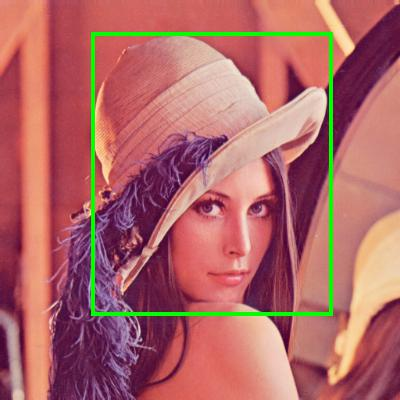

to get started let's go list our **images**

In [ ]:
# list all files
image_paths = listdir(os.environ['DATASET_FOLDER_NAME'] + '/data/*.*', '*.jpg')

## 🌁 Horizontal and Vertical flip

**Example of flip horizontal and vertical**

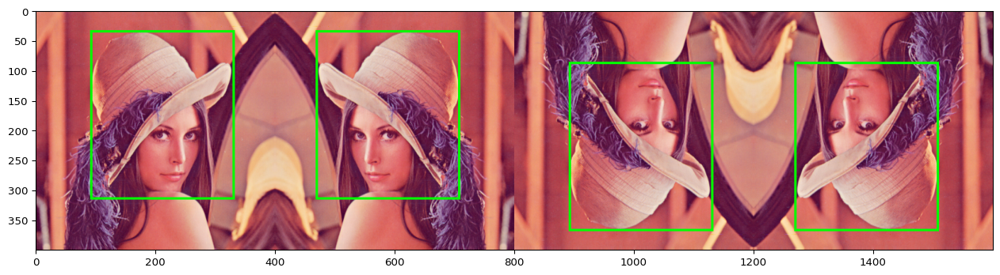

In [ ]:
methods = [
  [iaa.Fliplr(0)], # normal
  [iaa.Fliplr(1.0)], # horizontal flip
  [iaa.Fliplr(0), iaa.Flipud(1.0)], # normal vertical flip
  [iaa.Fliplr(1.0), iaa.Flipud(1.0)], # horizontal flip + vertical flip
]

bounding_box = RMBoundingBox(
  center_x=hat_bounding_box_coord[0],
  center_y=hat_bounding_box_coord[1],
  width=hat_bounding_box_coord[2],
  height=hat_bounding_box_coord[3],
  shape=example_image.shape
)
bbs = BoundingBoxesOnImage([bounding_box], shape=example_image.shape)

images_aug = []
for items in methods:
  seq = iaa.Sequential(items, random_order=True)
  image_aug, bbs_aug = seq(image=example_image, bounding_boxes=bbs)
  images_aug.append(bbs_aug.draw_on_image(image_aug, size=4))

ia.imshow(ia.draw_grid(images_aug, cols=3, rows=1))

**Make a horizontal and vertical flip**

In [ ]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.5), # vertically flip 50% of all images
], random_order=True)

# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/flip'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation flip done!")

Augmentation flip done!


## ✂️ Horizontal and Vertical crop and pad

In [ ]:
seq = iaa.Sequential([
  iaa.CropAndPad(percent=(-0.25, 0.25), pad_mode="edge"),  # crop and pad images
], random_order=True)

**Example of crop and pad horizontal and vertical**

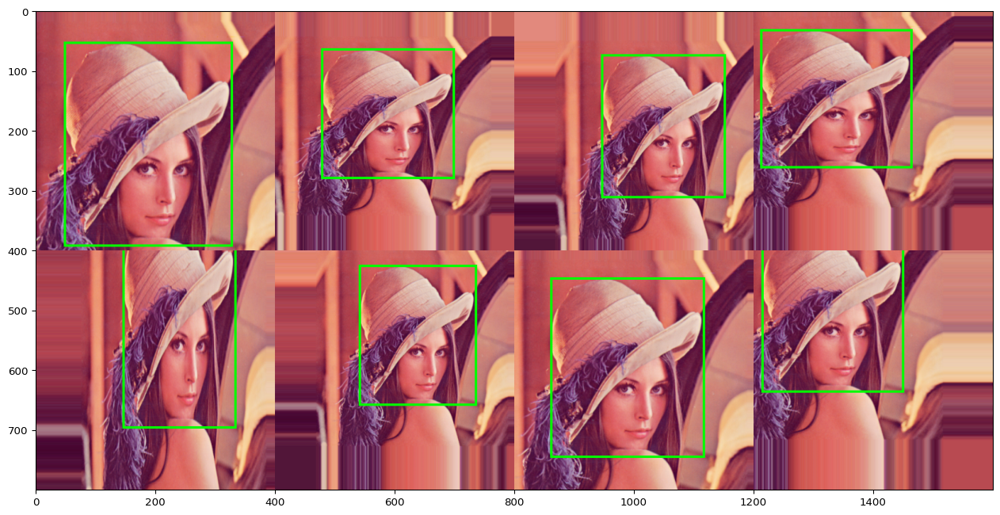

In [ ]:
show_example_with_sequential(sequential=seq)

**Make crop and pad horizontal and vertical**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/crop_pad'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation crop and pad done!")

Augmentation crop and pad done!


## 🔭 Zoom

In [ ]:
seq = iaa.Sequential([
  iaa.Affine(scale=(0.5, 2.0))
], random_order=True)

**Example of zoom**

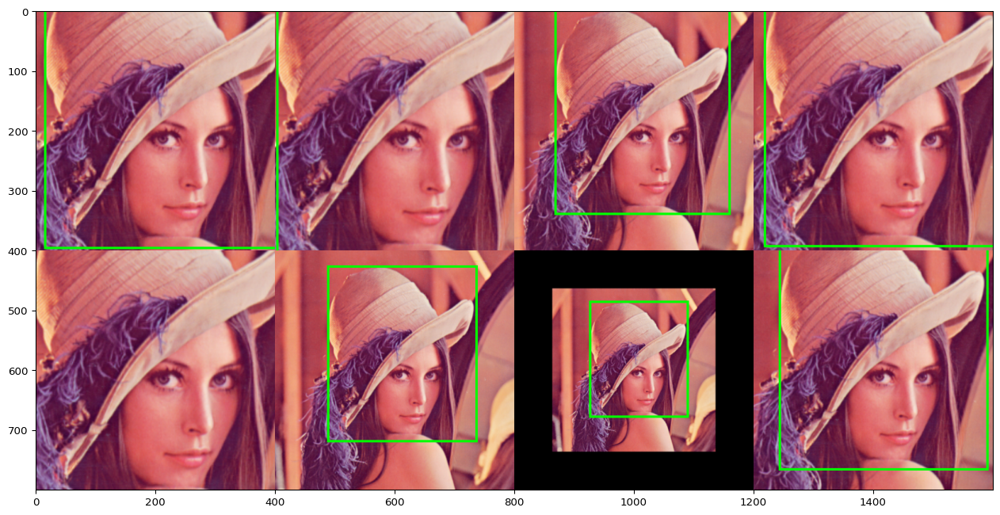

In [ ]:
show_example_with_sequential(sequential=seq)

**Make a zoom**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/zoom'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation zoom done!")

Augmentation zoom done!


## 🌀 Rotation

In [ ]:
seq = iaa.Sequential([
  iaa.Affine(rotate=(-45, 45))
], random_order=True)

**Example of rotate**

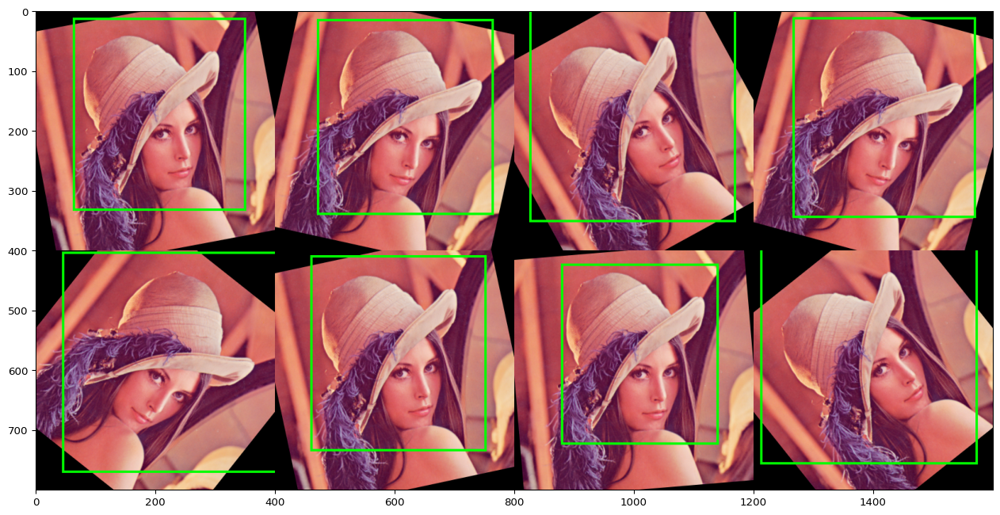

In [ ]:
show_example_with_sequential(sequential=seq)

**Make a rotate**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/rotate'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation rotate done!")

Augmentation rotate done!


## 💡 Brightness

In [ ]:
seq = iaa.Sequential([
  iaa.WithBrightnessChannels(iaa.Add((-150, 100))),
  iaa.MultiplyBrightness((0.5, 1.5))
], random_order=True)

 **Example of brightness**

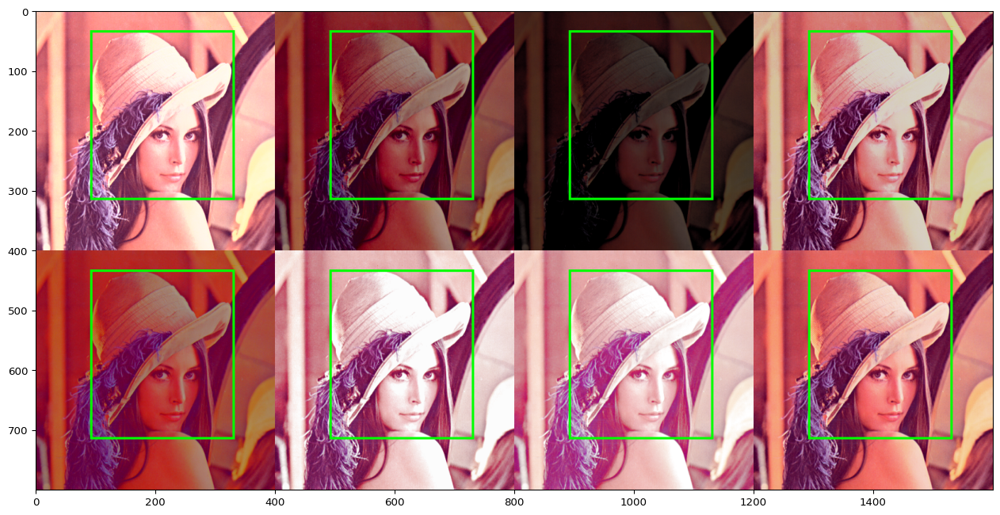

In [ ]:
show_example_with_sequential(sequential=seq)

**Make a brightness**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/brightness'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation brightness done!")

Augmentation brightness done!


## 💦 Transformation (water-like effect)

In [ ]:
seq = iaa.Sequential([
  iaa.ElasticTransformation(alpha=90, sigma=9),
  iaa.PerspectiveTransform(scale=(0.01, 0.15))
], random_order=True)

**Example of transformation**

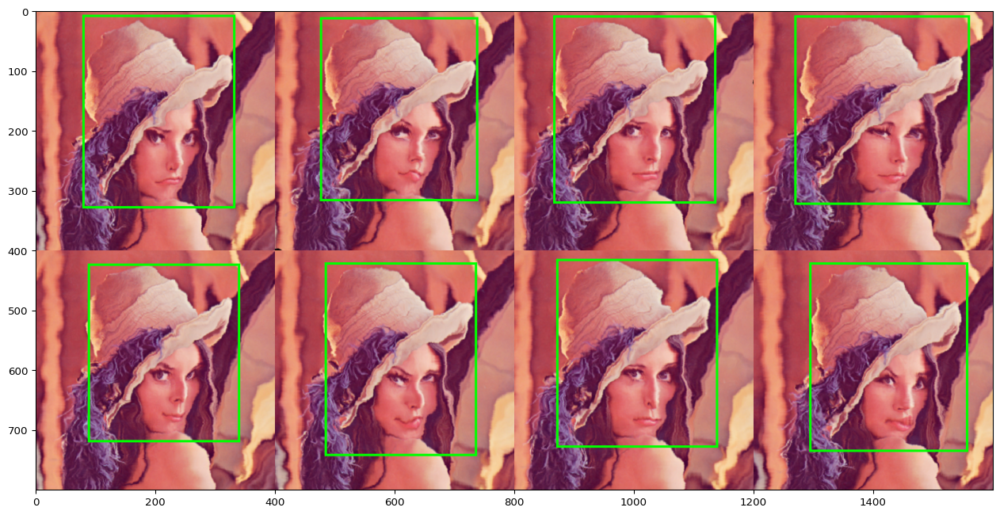

In [ ]:
show_example_with_sequential(sequential=seq)

**Make a transformation**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/transformation'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation transformation done!")

Augmentation transformation done!


## 🌌 Saturation

In [ ]:
seq = iaa.Sequential([
  iaa.MultiplyHueAndSaturation((0.5, 1.5), per_channel=True)
], random_order=True)

**Example of saturation**

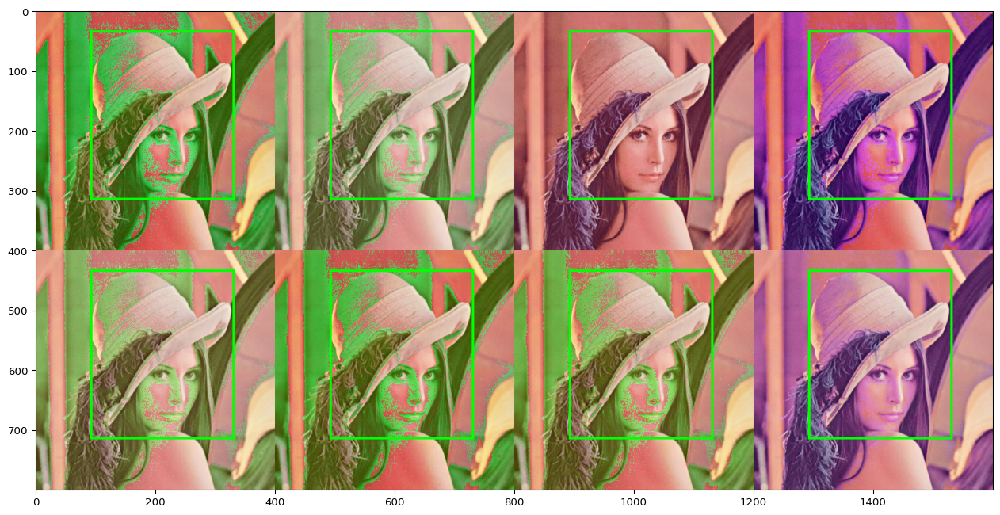

In [ ]:
show_example_with_sequential(sequential=seq)

**Make a saturation**

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/saturation'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation saturation done!")

Augmentation saturation done!


## 🐲 Very Complex Augmentation Pipeline (memory crash)

Apply a very heavy augmentation pipeline to images.

[README](https://github.com/aleju/imgaug#example-very-complex-augmentation-pipeline)

In [ ]:
# Sometimes(0.5, ...) applies the given augmenter in 50% of all cases,
# e.g. Sometimes(0.5, GaussianBlur(0.3)) would blur roughly every second image.
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

In [ ]:
seq = iaa.Sequential([
    # apply the following augmenters to most images
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
        
    # crop images by -5% to 10% of their height/width
    sometimes(iaa.CropAndPad(
      percent=(-0.05, 0.1),
      pad_mode=ia.ALL,
      pad_cval=(0, 255)
    )),

    sometimes(iaa.Affine(
      scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
      translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
      rotate=(-45, 45), # rotate by -45 to +45 degrees
      shear=(-16, 16), # shear by -16 to +16 degrees
      order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
      cval=(0, 255), # if mode is constant, use a cval between 0 and 255
      mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
    )),

     # execute 0 to 5 of the following (less important) augmenters per image
    # don't execute all of them, as that would often be way too strong
    iaa.SomeOf((0, 5),
        [
          sometimes(iaa.Superpixels(p_replace=(0, 1.0), n_segments=(20, 200))), # convert images into their superpixel representation
          iaa.OneOf([
            iaa.GaussianBlur((0, 3.0)), # blur images with a sigma between 0 and 3.0
            iaa.AverageBlur(k=(2, 7)), # blur image using local means with kernel sizes between 2 and 7
            iaa.MedianBlur(k=(3, 11)), # blur image using local medians with kernel sizes between 2 and 7
          ]),
          iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)), # sharpen images
          iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)), # emboss images
          # search either for all edges or for directed edges,
          # blend the result with the original image using a blobby mask
          iaa.BlendAlphaSimplexNoise(iaa.OneOf([
            iaa.EdgeDetect(alpha=(0.5, 1.0)),
            iaa.DirectedEdgeDetect(alpha=(0.5, 1.0), direction=(0.0, 1.0)),
          ])),
          iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
          iaa.OneOf([
            iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
            iaa.CoarseDropout((0.03, 0.15), size_percent=(0.02, 0.05), per_channel=0.2),
          ]),
          iaa.Invert(0.05, per_channel=True), # invert color channels
          iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
          iaa.AddToHueAndSaturation((-20, 20)), # change hue and saturation
          # either change the brightness of the whole image (sometimes
          # per channel) or change the brightness of subareas
          iaa.OneOf([
            iaa.Multiply((0.5, 1.5), per_channel=0.5),
            iaa.FrequencyNoiseAlpha(
              exponent=(-4, 0),
              first=iaa.Multiply((0.5, 1.5), per_channel=True),
              second=iaa.LinearContrast((0.5, 2.0))
            )
          ]),
          iaa.LinearContrast((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
          iaa.Grayscale(alpha=(0.0, 1.0)),
          sometimes(iaa.ElasticTransformation(alpha=(0.5, 3.5), sigma=0.25)), # move pixels locally around (with random strengths)
          sometimes(iaa.PiecewiseAffine(scale=(0.01, 0.05))), # sometimes move parts of the image around
          sometimes(iaa.PerspectiveTransform(scale=(0.01, 0.1)))
        ],
        random_order=True
    )
], random_order=True)

/usr/local/lib/python3.6/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `FrequencyNoiseAlpha()` is deprecated. Use `BlendAlphaFrequencyNoise` instead. FrequencyNoiseAlpha is deprecated. Use BlendAlphaFrequencyNoise instead. The order of parameters is the same. Parameter 'first' was renamed to 'foreground'. Parameter 'second' was renamed to 'background'.
  warn_deprecated(msg, stacklevel=3)


**Example of modifications**

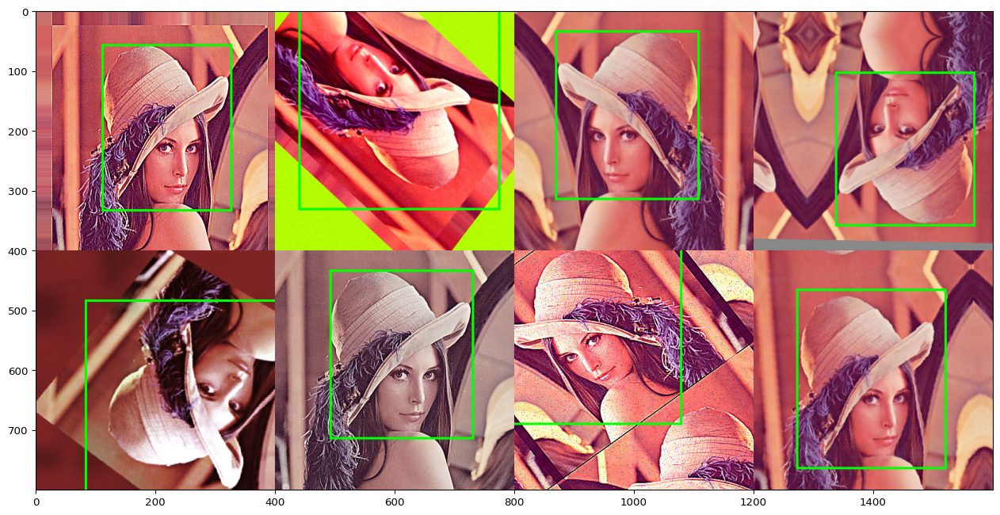

In [ ]:
show_example_with_sequential(sequential=seq)

Make a complex augmentation

In [ ]:
# apply modify batch
for path in image_paths:
  image, classes_index, bbs = image_info_basepath(path=path)
  augmentation_images_sequential(
    seq=seq,
    image=image,
    bbs=bbs,
    classes_index=classes_index,
    save_dir=os.environ['DATASET_FOLDER_NAME'] + '/aug/complex'
  )

  # free memory
  del image
  del classes_index
  del bbs

print("Augmentation complex done!")

Augmentation complex done!


# 🔪 Split dataset between train and test

**Pipeline**

  1. Matrics
  2. Create train and test folders
  3. Split dataset between train and test
  4. Move files train and test to train and test folder
  5. Clean

Matrics

In [ ]:
dataset_paths = []
dataset_paths.extend(listdir(os.environ['DATASET_FOLDER_NAME'] + '/aug/**/*.*', '*.jpg'))
dataset_paths.extend(listdir(os.environ['DATASET_FOLDER_NAME'] + '/data/*.*', '*.jpg'))

print("Original size....: {}".format(str(len(image_paths))))
print("Augmentation size: {}".format(str(len(dataset_paths))))

Original size....: 257
Augmentation size: 2056


Create train and test folders

In [ ]:
!mkdir -p $DATASET_FOLDER_NAME/train $DATASET_FOLDER_NAME/test

Split dataset between train and test

In [ ]:
test_size = 0.33
train_paths = []
test_paths = []

# split original files
original_files = listdir(os.environ['DATASET_FOLDER_NAME'] + '/data/*.*', '*.jpg')
X, y = train_test_split(original_files, test_size=test_size)
train_paths.extend(X)
test_paths.extend(y)

# split augmentation files
aug_path = os.path.join(os.environ['DATASET_FOLDER_NAME'], 'aug')
for name in os.listdir(aug_path):
  if os.path.isdir(os.path.join(aug_path, name)):
    files = listdir(os.path.join(aug_path, name) + '/*.*', '*.jpg')
    X, y = train_test_split(files, test_size=test_size)

    train_paths.extend(X)
    test_paths.extend(y)

Move files train and test to train and test folder

In [ ]:
for path in train_paths:
  if not os.path.exists(os.environ['DATASET_FOLDER_NAME']+'/train/' + os.path.basename(path)):
    shutil.move(path, os.environ['DATASET_FOLDER_NAME']+'/train/')
    shutil.move(annotation_path(path), os.environ['DATASET_FOLDER_NAME']+'/train/')

for path in test_paths:
  if not os.path.exists(os.environ['DATASET_FOLDER_NAME']+'/test/' + os.path.basename(path)):
    shutil.move(path, os.environ['DATASET_FOLDER_NAME']+'/test/')
    shutil.move(annotation_path(path), os.environ['DATASET_FOLDER_NAME']+'/test/')

Clean

In [ ]:
!rm -rf $DATASET_FOLDER_NAME/data $DATASET_FOLDER_NAME/aug

# 📦 Dataset packaging

In [ ]:
os.environ['AUGMENTED_DATASET_FILE_NAME'] = os.environ['DATASET_FILE_NAME'].split('.')[0] + '_dataset_augmented.tar.gz'

In [ ]:
!rm -rf $AUGMENTED_DATASET_FILE_NAME

In [ ]:
!tar -cvf $AUGMENTED_DATASET_FILE_NAME $DATASET_FOLDER_NAME

dataset/
dataset/chess-pieces.names
dataset/train/
dataset/train/494b4ffa3b12241cdcea6cafa3bda4d0.jpg
dataset/train/10afb1e8408140afe93a30b158004897.txt
dataset/train/bc20a5f74579dc740e26ab9705519846.txt
dataset/train/84bad083d7605b8bcc964dba714408b3.jpg
dataset/train/7e0a3d538f48035fad37b789c901a825.txt
dataset/train/e12e194bd83f99aec1ebf8143a0d7c76.txt
dataset/train/34c165c40fe76b625b15ea575a09d8d0.txt
dataset/train/41ea1a9f718e6b392e831b5f9f796455.jpg
dataset/train/a5205c53e0d358bce3d85ad02a56b136.jpg
dataset/train/5311d4600407ed71c9da4df8cbd373da.txt
dataset/train/85c14074c962fb63c47dcc6ed3753791.txt
dataset/train/84f03efa2b9f746c464ad92e3bdf1ff5.jpg
dataset/train/1611b3e8ea1201c7b6e2e9010126aec4.jpg
dataset/train/7b62fd12b20f79afa9ee1636085792e7.jpg
dataset/train/84679609e3053d2f677f0ea03e32f316.jpg
dataset/train/8cd20bbf00c5af3094011c0acfc2c3be.txt
dataset/train/7793a35378f440eab98190a6d98ae2ac.txt
dataset/train/f32c761c1f350d636c57848a877910ac.txt
dataset/train/83d9a0af13a853cb6

In [ ]:
%cp $AUGMENTED_DATASET_FILE_NAME /content/drive/MyDrive/DEEP\ LEARNING/dataset/

# 💣 Test

## Test 1

In [ ]:
!pip install git+https://github.com/aleju/imgaug.git

In [ ]:
import imageio
import imgaug as ia
%matplotlib inline
from imgaug import augmenters as iaa
ia.seed(4)

In [ ]:
image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")

print("Original:")
ia.imshow(image)

In [ ]:
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode="edge"),  # crop and pad images
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9),  # water-like effect
    iaa.Cutout()  # replace one squared area within the image by a constant intensity value
], random_order=True)

images_aug = [seq(image=image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

## Test 5

In [ ]:
# PROBLEMA
#
# 1. Carregamos o dataset
# 2. carregamos as anotaçÕes q estavam no formato darknet (center_x, center, w e h) ex: (0.111 0.2222)
# 3. convertemos esse formato para x1, x2, y1, y2 ex: (190.9 180.8)
# 4. com esse formato pudemos criar os boundingboxes e trabahar com a biblioteca imgaug
# 5. com as augumentações feitas as novas imagens e bounding boxes em mãos nos deparamos com o problema de conversão das anotações
# 6. Agora precisamos sair do format x1, x2, y1, y2 e ir para o formato darknet

```xml
<annotation>
	<folder>Chess Detection</folder>
	<filename>IMG_2012.JPG</filename>
	<path>C:\Users\Gilbert\Google Drive\Brand\Datasets\Chess Detection\IMG_2012.JPG</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>4000</width>
		<height>2248</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>black-knight</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1857</xmin>
			<ymin>886</ymin>
			<xmax>2298</xmax>
			<ymax>1355</ymax>
		</bndbox>
	</object>
</annotation>
```

In [ ]:
!cat /content/augmentation_dataset/test/IMG_2012.txt

In [ ]:
path = image_paths[0]
image = imageio.imread(path)
bbs = bounding_boxes(img_path=path, shape=image.shape)

print(bbs[0])

In [ ]:
# https://github.com/ssaru/convert2Yolo/blob/c91f4a42f93b53352721c2dec9da607d92c841c1/Format.py#L616
def convert2Yolo(x1, y1, x2, y2, shape):
  """
  Convert Pascal VOC annotation to Darknet annotation
  """
  dw = 1. / shape[1]
  dh = 1. / shape[0]

  center_x = (x1 + x2)  / 2.0
  center_y = (y1 + y2) / 2.0
  w = x2 - x1
  h = y2 - y1

  center_x = center_x * dw
  center_y = center_y * dh
  w = w * dw
  h = h * dh
  return (round(center_x, 6), round(center_y, 6), round(w, 6), round(h, 6))

In [ ]:
# Precisamos fazer as seguintes conversões
# x1|xmin => 1857  => 0.519500
# y1|ymin => 886   => 885.9986
# x2|xmax => 2298  => 2299.0000
# y2|ymax => 1355  => 1355.9992

x1 = 1857
y1 = 886
x2 = 2298
y2 = 1355
shape=(2248, 4000)

# 0.519500 0.498665 0.110500 0.209075
print(convert2Yolo(x1, y1, x2, y2, shape))

# aqui está a função que irá converter pascal VOC em Darknet annotation

In [ ]:
!rm -rf augmentation_dataset/aug
!rm -rf augmentation_dataset.tar.gz

In [ ]:
!tar -cvf augmentation_dataset.tar.gz augmentation_dataset

## Test 2

In [ ]:
%cp /content/drive/MyDrive/DEEP\ LEARNING/dataset/chess-piece-v5-dataset_dataset_augmented.tar.gz ./

In [ ]:
!tar -xvf chess-piece-v5-dataset_dataset_augmented.tar.gz

In [ ]:
labels = open('/content/dataset/chess-pieces.names').read().strip().split('\n')
print(labels)

['white-pawn', 'white-rook', 'white-bishop', 'white-knight', 'white-king', 'white-queen', 'black-pawn', 'black-rook', 'black-bishop', 'black-king', 'black-queen', 'black-knight']


In [ ]:
names = []
for txt in listdir('/content/dataset/train/*.*', '*.txt'):
  with open(txt) as f:
    for line in f:
      class_idx, _, _, _, _ = line.strip().split(' ')
      names.append(labels[int(class_idx)])

In [ ]:
#count
classes = list(dict.fromkeys(names))
metrics = list(map(lambda c: "{} | {}".format(str(names.count(c)), c), classes))
print('\n'.join(metrics))

466 | white-rook
333 | white-knight
234 | white-bishop
237 | white-queen
295 | white-king
1774 | white-pawn
1221 | black-pawn
309 | black-rook
440 | black-bishop
336 | black-knight
302 | black-king
97 | black-queen


## Test 6

In [ ]:
def annotation_path(img_path):
  """
  Load path of annotation base image path
  """
  file_name, _ = os.path.splitext(os.path.basename(img_path))
  file_dir = os.path.dirname(img_path)
  return os.path.join(file_dir, file_name + '.txt')

In [ ]:
img_path = '/content/dataset/data/1622461963.032269.jpg'
annotation_path(img_path)

'/content/dataset/data/1622461963.032269.txt'